In [1]:
import networkx as nx
import random
import networkx as nx
from matplotlib import pyplot, patches
from scipy import io
import numpy as np
from collections import defaultdict
import pickle
import pandas as pd
from tqdm import tqdm
import matplotlib.ticker as ticker
import matplotlib.pyplot as plt 

C:\Users\wyw25\anaconda3\lib\site-packages\pandas\core\computation\expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
C:\Users\wyw25\anaconda3\lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.2' currently installed).
  from pandas.core import (


In [2]:
# import empirical netwrok
em_mat=pd.read_csv('C:/Users/wyw25/thesis/MAT_experiment/2018-01-25.csv', header=None)

In [3]:
# load the nestedness of the empirical netwrok
N_list=[]
Q_list=[]
I_list=[]
I_MQ_list=[]

for i in range(200):
    nestedness=pd.read_csv("C:/Users/wyw25/thesis/2018-01-25/"+str(i)+"/data_structures_NQI_results2018-01-25.csv")
    
    N=nestedness['N'].values[0]
    Q=nestedness['Q'].values[0]
    I=nestedness['I'].values[0]
    I_MQ=nestedness['I_MQ'].values[0]
    
    
    N_list.append(N)
    Q_list.append(Q)
    I_list.append(I)
    I_MQ_list.append(I_MQ)


In [4]:
N_observation=np.mean(N_list)
Q_observation=np.mean(Q_list)
I_observation=np.mean(I_list)
I_MQ_observation=np.mean(I_MQ_list)


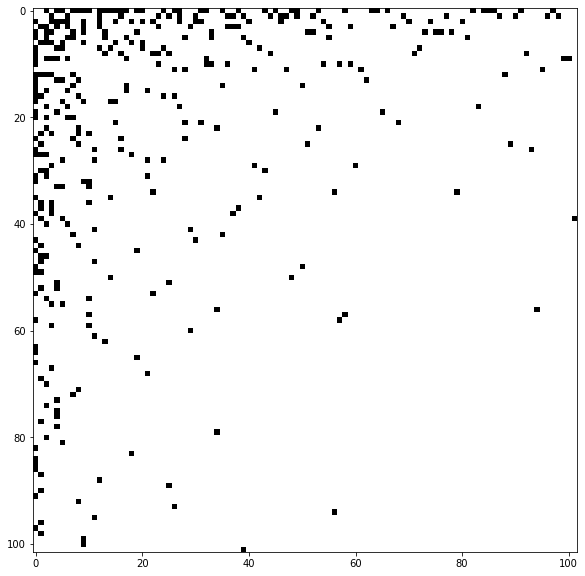

In [9]:
G_empirical=nx.from_numpy_array(np.array(em_mat))
degreeofday=dict(G_empirical.degree)
degreeofday_new={k: v for k, v in sorted(degreeofday.items(), key=lambda item: item[1], reverse=True)}
nodenewlist=list(degreeofday_new.keys())
draw_adjacency_matrix(G_empirical,nodenewlist)

In [ ]:
# import the simulated network
# load the dict of dataframes
with open('simulation_100/simulation_100.pkl', 'rb') as fp:
    simutable = pickle.load(fp)


In [ ]:
# import the computed Q, nodf, IBNestedness of all simulated point

with open('parameter_100/I.pkl', 'rb') as fp:
    I = pickle.load(fp)
    
with open('parameter_100/Q.pkl', 'rb') as fp:
    Q = pickle.load(fp)
    
with open('parameter_100/N.pkl', 'rb') as fp:
    N = pickle.load(fp)
    
with open('parameter_100/I_MQ.pkl', 'rb') as fp:
    I_MQ = pickle.load(fp)


In [ ]:
def draw_adjacency_matrix(G, node_order=None, partitions=[], colors=[]):
    """
    - G is a netorkx graph
    - node_order (optional) is a list of nodes, where each node in G
          appears exactly once
    - partitions is a list of node lists, where each node in G appears
          in exactly one node list
    - colors is a list of strings indicating what color each
          partition should be
    If partitions is specified, the same number of colors needs to be
    specified.
    """
    adjacency_matrix = nx.to_numpy_array(G, dtype=bool, nodelist=node_order)

    #Plot adjacency matrix in toned-down black and white
    fig = pyplot.figure(figsize=(10, 10)) # in inches
    pyplot.imshow(adjacency_matrix,
                  cmap="Greys",
                  interpolation="none")
    
    # The rest is just if you have sorted nodes by a partition and want to
    # highlight the module boundaries
    assert len(partitions) == len(colors)
    ax = pyplot.gca()
    for partition, color in zip(partitions, colors):
        current_idx = 0
        for module in partition:
            ax.add_patch(patches.Rectangle((current_idx, current_idx),
                                          len(module), # Width
                                          len(module), # Height
                                          facecolor="none",
                                          edgecolor=color,
                                          linewidth=1))
            current_idx += len(module)

In [ ]:
#combination1

def Compute_properties(G,i,j,k,I,Q,N,I_MQ):
    
    average_degree = sum([val for (node, val) in G.degree()])/float(len(G))
   # average_path_length=nx.average_shortest_path_length(G)
    clustering_coefficient=nx.average_clustering(G)
    
    Q_index = Q[i][j][k]  # Replace None with your default value for Q
    N_index = N[i][j][k]   # Replace None with your default value for N
    I_index = I[i][j][k]  # Replace None with your default value for I
  #  I_MQ_index = I_MQ[i][j][k]  
   
    return average_degree,clustering_coefficient,Q_index,N_index,I_index

def Compute_properties_OBSERVATION(G,N_observation,I_observation,Q_observation,I_MQ_observation):
    
    average_degree = sum([val for (node, val) in G.degree()])/float(len(G))
   # average_path_length=nx.average_shortest_path_length(G)
    clustering_coefficient=nx.average_clustering(G)
    
    Q_index=Q_observation
    N_index=N_observation
    I_index=I_observation
   # I_MQ_index=I_MQ_observation   
    
    return average_degree,clustering_coefficient,Q_index,N_index,I_index

In [ ]:
# combination2

def Compute_properties(G,i,j,k,I,Q,N,I_MQ):
    
  #  average_degree = sum([val for (node, val) in G.degree()])/float(len(G))
   # average_path_length=nx.average_shortest_path_length(G)
  #  clustering_coefficient=nx.average_clustering(G)
    
    Q_index = Q[i][j][k]  # Replace None with your default value for Q
    N_index = N[i][j][k]   # Replace None with your default value for N
    I_index = I[i][j][k]  # Replace None with your default value for I
  #  I_MQ_index = I_MQ[i][j][k] 
        
    
    return Q_index,N_index,I_index

def Compute_properties_OBSERVATION(G,N_observation,I_observation,Q_observation,I_MQ_observation):
    
   # average_degree = sum([val for (node, val) in G.degree()])/float(len(G))
   # average_path_length=nx.average_shortest_path_length(G)
  #  clustering_coefficient=nx.average_clustering(G)
    
    Q_index=Q_observation
    N_index=N_observation
    I_index=I_observation
   # I_MQ_index=I_MQ_observation   
    
    return Q_index,N_index,I_index

In [ ]:
# combination3

def Compute_properties(G,i,j,k,I,Q,N,I_MQ):
    
    average_degree = sum([val for (node, val) in G.degree()])/float(len(G))
   # average_path_length=nx.average_shortest_path_length(G)
    clustering_coefficient=nx.average_clustering(G)
    
    Q_index = Q[i][j][k]  # Replace None with your default value for Q
    N_index = N[i][j][k]   # Replace None with your default value for N
    I_index = I[i][j][k]  # Replace None with your default value for I
  #  I_MQ_index = I_MQ[i][j][k] 
    
    
    
    return average_degree,clustering_coefficient

def Compute_properties_OBSERVATION(G,N_observation,I_observation,Q_observation,I_MQ_observation):
    
    average_degree = sum([val for (node, val) in G.degree()])/float(len(G))
   # average_path_length=nx.average_shortest_path_length(G)
    clustering_coefficient=nx.average_clustering(G)
    
    Q_index=Q_observation
    N_index=N_observation
    I_index=I_observation
   # I_MQ_index=I_MQ_observation   
    
    return average_degree,clustering_coefficient

In [235]:
def likelihood(params, real_data, simulated_data,uncertainty):
    """
    Calculate the likelihood of observing the real data given the parameters.

    Parameters:
    - params: array-like, the parameters (pL_s, pL_d, pNL_nl)
    - real_data: array-like, the real network properties (average_degree, average_path_length, clustering_coefficient)
    - simulated_data: array-like, the simulated network properties for the given parameters
    - uncertainties: array-like, uncertainties for each network property

    Returns:
    - likelihood_value: float, the likelihood value
    """
    # Calculate the squared differences between simulated and real data

    squared_diff = ((simulated_data - real_data) / uncertainty)**2


    # Calculate the log-likelihood (assuming normal distribution)
    log_likelihood = -0.5 * np.sum(squared_diff)
    likelihood=np.exp(log_likelihood)

    return likelihood



In [258]:
parameter_LIST = {}
for i in tqdm(range(len(simutable))):
    parameter_LIST[i] = {}
    for j in range(len(simutable[1])):
        parameter_LIST[i][j] = {}
        for k in range(len(simutable[1][1])):
            simumat=simutable[i][j][k]
            G_simu=nx.from_numpy_matrix(np.array(simutable[i][j][k]))
            parameter_simu=np.array(Compute_properties(G_simu,i,j,k,I,Q,N,I_MQ))
            parameter_LIST[i][j][k]=parameter_simu

100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:38<00:00,  1.94s/it]


In [259]:
all_arrays = [array for outer_dict in parameter_LIST.values() for inner_dict in outer_dict.values() for array in inner_dict.values()]

# Concatenate all arrays into a single array
all_data = np.concatenate(all_arrays)

# Calculate the standard deviation for each variable
# Calculate the standard deviation for each variable
uncertaintylist=[]
for i in range(3):
    std_variable = np.nanstd(all_data[i::3])  # Variable 0 is at every 3rd index
    uncertaintylist.append(std_variable)

print("Standard Deviation of Variable 0:", std_variable_0)
print("Standard Deviation of Variable 1:", std_variable_1)
print("Standard Deviation of Variable 2:", std_variable_2)

Standard Deviation of Variable 0: 2.129622198568522
Standard Deviation of Variable 1: 2.130706615454435
Standard Deviation of Variable 2: 2.1076386934590197


In [260]:
uncertaintylist

[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]

In [261]:
# Example usage:
# Replace the following with your actual data and uncertainties
real_data =np.array(Compute_properties_OBSERVATION(G_empirical,N_observation,I_observation,Q_observation,I_MQ_observation))
#uncertainties = np.array([0.2, 0.2, 0.2])
likelihoodlist=[]

compare=0
i_max=0
j_max=0
k_max=0

for i in range(len(simutable)):
    for j in range(len(simutable[1])):
        for k in range(len(simutable[1][1])):           
            simulated_data = parameter_LIST[i][j][k]

            # Replace with the actual parameter values you want to evaluate
            parameters_to_evaluate = np.array([0.5,0.5, 0.5])
            uncertainty=uncertaintylist

            # Calculate the likelihood for the given parameters
            likelihood_value = likelihood(parameters_to_evaluate, real_data, simulated_data,uncertainty)
            
            if np.isnan(likelihood_value):
                likelihood_value=0
            if likelihood_value>compare:
                compare=likelihood_value
                i_max=i
                j_max=j
                k_max=k
                
            
            likelihoodlist.append(likelihood_value)

            print("Likelihood:", likelihood_value)

[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0


[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0


[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.20408

Likelihood: 0.005683097016893328
[1.74463618e-16 3.03030303e-03 2.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005343278949233
[0.         0.00121212 0.00857143]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004884349281644317
[-5.55111512e-17  3.03030303e-03  4.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006130790129523723
[0.         0.00424242 0.04      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006163263339353987
[0.         0.00424242 0.03333333]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0058919254239486055
[0.         0.00020202 0.00020202]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.2350

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006130790129523723
[0.        0.0020202 0.03     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005703370800951572
[0.         0.00565657 0.0125    ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005123396980648007
[0.         0.00424242 0.03      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005759031852110363
[0.40123457 0.00222222 0.02      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.1691900934827123
[-5.55111512e-17  3.03030303e-03  3.33333333e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005860881848481948
[1.74463618e-16 3.03030303e-03 4.00

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006201089742641043
[0.         0.02424242 0.13      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.011356136154219784
[2.22044605e-16 1.35353535e-02 6.02702703e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.007314728613846355
[3.18585738e-16 3.85858586e-02 1.30000000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.011973613687350407
[0.         0.01333333 0.06      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.007296147920591257
[0.08171745 0.02444444 0.134     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.041064090971308316
[1.11022302e-16 1.333

[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.010684299223591652
[0.02929687 0.01858586 0.08      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.013707807884808944
[0.         0.00222222 0.03      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005708436554375915
[0.08       0.00121212 0.01714286]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.01796585968182576
[-5.55111512e-17  2.12121212e-02  1.20000000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.010658887635915814
[0.06401384 0.02444444 0.09428571]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.02586738667641008
[-5.55111512e-17  9.09090909e-03  3.33333333e-02]
[0.40155426 0.185

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.01406867712038739
[-2.10942375e-16  3.45454545e-02  1.60000000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.013627206891831379
[0.1294896  0.03656566 0.12      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.07333327773530599
[-2.10942375e-16  3.47474747e-02  1.60000000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.01363715916424585
[-1.26882631e-16  3.15151515e-02  1.82000000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.014821565526517195
[0.03780718 0.03508418 0.14      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.023117819701572125
[0.

[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.014716162570003884
[0.14127219 0.04348485 0.17027778]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.10934453493910332
[7.65671051e-17 4.35858586e-02 1.92500000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.016137646238037727
[0.24108887 0.21577778 0.43426667]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5660929487185724
[0.21052632 0.01858586 0.11027027]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.14548350823602632
[2.07563435e-16 3.00000000e-02 1.49230769e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.012751446936515354
[0.02646503 0.04262626 0.2       ]
[0.40155426 0.18516936 0.

Likelihood: 0.43129247360466766
[0.30098765 0.0286532  0.10111111]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.2532824746888291
[0.20158267 0.06613709 0.26176812]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.2934384951150174
[0.24141519 0.03799663 0.15392157]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.24597783446456445
[0.21268902 0.06830303 0.20688312]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.27209066804317433
[0.26977989 0.08770202 0.23      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.4588674233189338
[0.33908388 0.05505628 0.24625   ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.58923

Likelihood: 0.0969733031002201
[0.17256198 0.13694565 0.309     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.2880545621693531
[0.28255208 0.09092031 0.29958333]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5943544397757631
[0.19579922 0.13775758 0.31909812]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.36440782450075315
[0.19802469 0.10326599 0.24132121]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.2934976019293529
[0.31064975 0.11581369 0.34575758]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.7617911241698254
[0.37913083 0.11418895 0.348     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.8996069

[0.21092916 0.34227375 0.55554085]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.2813809084898076
[0.20686665 0.33721493 0.52601274]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.2973552682350008
[0.25918445 0.30978114 0.55937908]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.438783319993428
[0.07553436 0.29250665 0.45619497]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.08736067994872457
[0.09317371 0.22040805 0.39055314]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.12769441033006612
[0.2235503  0.47674747 0.62672457]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.11928821985109576
[0.21449333 0.244814

[0.21912037 0.91785146 0.92721729]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 6.901024236846364e-05
[0.2258729  0.70611803 0.80351362]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004878469209102285
[0.24172009 0.6286493  0.7280483 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.02180309857337881
[0.54323731 0.13479567 0.32078217]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5870061222175089
[0.44768467 0.14006846 0.33991192]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.8920513552849487
[0.41346514 0.11815861 0.21575307]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.6719096817090747
[0.50999325 0.14

[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]


[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]


[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0.        0.0020202 0.04     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00610369539028783
[0.         0.00121212 0.03      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005683097016893328
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0.         0.00060606 0.02      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005286562124930946
[0.         0.00060606 0.02      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005286562124930946
[0

Likelihood: 0.006589716688553534
[0.25510204 0.00181818 0.03025316]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.11449942201515614
[0.         0.00424242 0.05      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006583939835642639
[0.         0.00141414 0.00141414]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0046389467503012895
[0.        0.0020202 0.04     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00610369539028783
[9.39419482e-17 1.17171717e-02 8.28571429e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.008336404204579997
[-7.06505561e-17  4.64646465e-03  1.76190476e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.235044

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006543318672778087
[0.10969388 0.01333333 0.09      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.04473235417005437
[0.04444444 0.01606061 0.11      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.020403406193848058
[0.04293629 0.0247138  0.09614035]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.019102866645850935
[9.99200722e-17 7.27272727e-03 7.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0075708812479726405
[0.15277778 0.00464646 0.02277017]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.046225916212779036
[0.33680556 0.00606061 0.05      

[-2.53130850e-16  2.83694084e-02  1.37063492e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.01195102921634943
[0.13265306 0.03796296 0.20868421]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.11337065169508595
[-3.90798505e-16  3.67070707e-02  1.39285714e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0124571489903858
[-1.77635684e-16  5.75252525e-02  1.52500000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.014216621457650559
[3.82410153e-16 4.48148148e-02 1.59803922e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.01411236918815115
[0.21550095 0.02949495 0.12230769]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.2350440410

[1.79343719e-16 4.30976431e-02 1.72857143e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.014861127639100897
[0.00887574 0.05181818 0.2       ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.019856295493819485
[1.85841680e-16 2.67171717e-02 1.59285714e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.013194367110462242
[0.21468144 0.02040404 0.12153846]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.16092113244320905
[2.22044605e-16 2.90572391e-02 1.30000000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.011566144980507136
[-2.22044605e-16  2.43434343e-02  1.36000000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.235044041038

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.09574760140341627
[0.07971446 0.08355219 0.3188    ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.08886248577814798
[0.21663379 0.07721501 0.29770751]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.37267439277194586
[0.08306926 0.11543771 0.28801587]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0936426293813495
[0.32644628 0.10913753 0.28875   ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.7240096847659029
[0.2888     0.13014815 0.29678571]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.6540444322063002
[-2.61228947e-17  7.77272727e-02  2.09559441e-01]
[0.4

Likelihood: 0.1636599552487521
[1.51394049e-16 9.75653976e-02 2.21594203e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.020830608257622167
[0.27709191 0.10254898 0.28560902]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5747938886161789
[0.23871528 0.11958153 0.30620536]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.48797458516377334
[1.75298372e-17 7.92653811e-02 2.70933333e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.023102479141361387
[0.25958799 0.64604489 0.77701783]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.014955108459965078
[0.18047337 0.13119108 0.2209375 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.2350440410

[0.36356353 0.10276936 0.27575725]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.7595676398035235
[0.27521778 0.14381355 0.32655851]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.6534037922886913
[0.28620029 0.72777858 0.78315304]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006210599890305623
[0.3223877  0.15818687 0.35470476]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.8431440916939061
[0.26186902 0.14485455 0.25111044]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5138264495834868
[0.23074074 0.27547889 0.45587938]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.47568578794813454
[0.27563096 0.30992

Likelihood: 0.0400256598592873
[0.14664545 0.76679217 0.76679217]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0013492414873387175
[0.13541924 0.62842275 0.62842275]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.013427642037387461
[0.1634865  0.80156265 0.82752319]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0006387368735546108
[0.15560232 0.7388925  0.7388925 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.002583809018728162
[0.17113675 0.78188219 0.80995438]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0010463035552795612
[0.15188226 0.66985102 0.66985102]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihoo

[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0


[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0.         0.00020202 0.005     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296

[0.         0.00121212 0.008     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004864108014561092
[0.         0.00121212 0.03      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005683097016893328
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0.51388889 0.00080808 0.01025   ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.11963695352945514
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[2.22044605e-16 2.22222222e-03 2.85714286e-03]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090

[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.034833863130680195
[1.11022302e-16 7.27272727e-03 4.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006244237166239784
[0.         0.00565657 0.03      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005794377325666551
[0.         0.01353535 0.08      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00825800339177682
[0.         0.00424242 0.02142857]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005425893971338687
[0.         0.00565657 0.05      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00662434809823472
[-4.44089210e-17  1.83838384e-02  7.00000000e-02]
[0.40155426 0.185169

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.015563863847914985
[0.14888889 0.0159596  0.11      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.07994932020779577
[-1.91765795e-16  3.50168350e-02  1.69259259e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.014222940468049328
[0.14936563 0.12230079 0.36752778]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.23983642852509118
[0.1366782  0.02141414 0.11      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0713530591853488
[0.27423823 0.00969697 0.05316667]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.15439835803624763
[0.14571006 0.01565657 0.08      ]


Likelihood: 0.6580891868587201
[0.26176421 0.32126794 0.51678252]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.4746618202487128
[0.20385489 0.63825404 0.77426772]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.011052750252479728
[0.25170068 0.02151515 0.15      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.24318858079273814
[0.22216441 0.05483405 0.17952381]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.2530946704483041
[2.46716228e-17 5.60606061e-02 1.80816171e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.01603068640296357
[0.0230095  0.0673771  0.24287879]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likeli

[0.17871129 0.12199776 0.31508418]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.30293632207994803
[0.19329024 0.14823653 0.34357759]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.37291684983426054
[0.32877066 0.06018759 0.2197619 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5337161152581691
[0.33019821 0.20483548 0.46810101]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.8653221920588151
[0.03061588 0.11686388 0.36183333]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0484013890738729
[0.14496528 0.11282828 0.2925641 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.20202290295830783
[0.22225208 0.56355

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.3564074703625679
[0.39148051 0.17913384 0.45284886]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.980777636278232
[0.54979629 0.08694565 0.3189447 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5158941000596584
[0.46568869 0.10773588 0.25605769]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.6879454937829684
[0.35121473 0.08014073 0.25638458]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.670517399268031
[0.40247325 0.09673001 0.22826006]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.6756464110282979
[0.39212828 0.13216965 0.31975018]
[0.40155426 0.18516936 0

[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0


Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.235

[0.         0.00060606 0.00060606]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004594847665999615
[1.11022302e-16 2.02020202e-04 2.02020202e-04]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004572908427208378
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[0.         0.00020202 0.00333333]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004679891450606118
[0.         0.00040404 0.00666667]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0047998946935680804
[0.         0.00020202 0.00020202]
[0.40155426 0.18516936 0.4

[0.         0.00424242 0.00952381]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004983922226985033
[1.11022302e-16 1.11111111e-02 8.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.008175344876104917
[0.         0.00424242 0.01826087]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005305929387163611
[0.         0.00424242 0.042     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006246095776785991
[0.         0.0020202  0.01428571]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0051079553862982624
[0.16666667 0.00141414 0.00857143]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0475703720593303

[6.47630098e-17 9.29292929e-03 9.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.008604384510485206
[0.         0.02747475 0.14      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.012083696734959442
[5.55111512e-17 1.83838384e-02 1.10000000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.009992239745740162
[9.08364293e-17 7.27272727e-03 2.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005442153507051988
[1.11022302e-16 1.33333333e-02 8.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.008251127843175386
[-1.37145197e-16  1.89898990e-02  9.20000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0

[0.0136742  0.03305051 0.12238095]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.014229238555254353
[-1.16309079e-16  3.83838384e-02  1.70000000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.014441089995971266
[0.1848     0.03622896 0.18537037]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.17731919642631638
[5.55111512e-17 1.83838384e-02 1.30000000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.011097403731861955
[0.08379501 0.06356902 0.12143791]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.04524122607998251
[0.         0.02747475 0.16      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0132

[0.36924763 0.03952381 0.19270833]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.4948760636770551
[0.37847222 0.0226633  0.169     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.42609429864058723
[0.46418733 0.05404377 0.25431548]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.6009402710666408
[0.40108471 0.03925926 0.19626894]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5126736656844254
[0.38231405 0.0502862  0.20275397]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5410724564206939
[0.3792924  0.06750457 0.18336519]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5268979262177031
[0.25826446 0.0268850

Likelihood: 0.7108314948436718
[0.21985978 0.25837514 0.45456427]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.4535644418440894
[0.19444444 0.22277007 0.41661111]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.39161241751215736
[0.16273789 0.18470774 0.38161199]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.2921337634615457
[0.29477396 0.28313695 0.49660576]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.6517924833169069
[0.27685282 0.27907174 0.51011179]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5882934590124971
[0.24606147 0.2342681  0.40083496]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5779432

[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0014531100260414768
[0.15844307 0.61614648 0.67885359]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.015721516551211966
[0.17340084 0.59898931 0.72179866]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.01736334941847181
[0.27420477 0.36086469 0.36086469]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.47707886486500334
[0.36681497 0.34108187 0.34108187]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.6974032025738192
[0.47314386 0.32964867 0.32964867]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.6579613359959299
[0.23205008 0.40743232 0.40743232]
[0.40155426 0.18516936 0.40977038]
[0.152676112935

[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0


[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0.         0.00020202 0.00020202]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00457290842720837
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[nan  0.  0.]
[0.40155426 0.18516936 0

Likelihood: 0.00507320735843557
[0.         0.00060606 0.01      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00492198025688224
[0.        0.0020202 0.02     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005319664578697458
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[0.         0.00020202 0.00133333]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004611369642613032
[0.14197531 0.00363636 0.05027027]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.04926203151148899
[0.         0.00121212 0.02      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005300754755946181
[0.    

[1.11022302e-16 1.33333333e-02 1.00000000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.009263786639415565
[0.17346939 0.00222222 0.04222222]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.06455063001429437
[0.         0.00222222 0.00857143]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004906127398634467
[0.         0.00585859 0.04313492]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006337528782811554
[0.13541667 0.00939394 0.07888889]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.056075929950189625
[0.        0.0020202 0.024    ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005471136203300018
[0

Likelihood: 0.14877118322469826
[0.10351562 0.00646465 0.03566667]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.028571538586758923
[-3.33066907e-17  3.23232323e-03  2.85714286e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005677612219999979
[0.09259259 0.031156   0.12422222]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.046409275786686396
[0.21759259 0.00979798 0.08090909]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.1256941290803663
[0.49234694 0.00262626 0.04376068]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.16708550329149596
[0.23111111 0.00656566 0.05022989]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]

[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.014902433759599853
[0.03858025 0.01765657 0.095     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.017255746847615893
[0.26074905 0.41090909 0.59198497]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.26250747271991287
[0.28178933 0.23851211 0.415671  ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.7102462309936743
[0.12413194 0.01723906 0.08691667]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.053250070982359156
[0.23611111 0.01434343 0.10221034]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.1663720076303887
[0.32030178 0.01878788 0.13333333]
[0.40155426 0.18516936 0.40977038]
[0.152676112935

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.4844320202202993
[1.51394049e-17 1.01591674e-01 2.90141414e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.025423010138470554
[0.18835549 0.16123737 0.40400602]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.3745015442711227
[-4.82947016e-16  7.95337995e-02  2.19000000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.019800337213509846
[0.23596497 0.72947352 0.81997504]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0034565708310597063
[0.23769605 0.10488522 0.349     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5032242283997517
[0.08275623 0.06660239 

[0.31246387 0.26150934 0.52923401]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.69116773454785
[0.21851226 0.26169327 0.52617601]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.40188029237021333
[0.1893424  0.17740652 0.37488529]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.3761695758649807
[0.24270716 0.80323324 0.85505474]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0009864989314057903
[0.2165651  0.26108546 0.43965404]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.444277400798287
[0.30062418 0.29387085 0.52572619]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.6175224379707881
[0.44409722 0.0985265

[0.16521583 0.75560446 0.75560446]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.002056715234359627
[0.17245966 0.73563233 0.73563233]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00326603160792446
[0.1404316  0.69553907 0.69553907]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0048515313807891685
[0.1671572  0.7736982  0.79189058]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0012839250040689696
[0.1915063  0.73205154 0.73205154]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0041835540739588156
[0.17753086 0.75837442 0.75837442]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0021974159731027315
[0.1642

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]


[4.44444444e-01 2.02020202e-04 2.02020202e-04]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.139688880185121
[0.         0.00040404 0.00040404]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00458386885979551
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.4015

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0.         0.00121212 0.02      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005300754755946181
[0.         0.00424242 0.04      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006163263339353987
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[0.16666667 0.00020202 0.00020202]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.04449744420135445
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[0.         0.00121212 0.03      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.

[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005300754755946181
[-5.55111512e-17  3.03030303e-03  3.33333333e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005860881848481948
[0.13541667 0.00929293 0.05666667]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.04884812455607172
[0.29166667 0.00080808 0.00080808]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.11296047934157663
[4.06250000e-01 2.02020202e-04 2.02020202e-04]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.14524231333847135
[0.         0.00060606 0.00060606]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004594847665999615
[0.         0.00020202 0.00020202]
[0.40155426 0.1851693

[0.         0.00424242 0.03333333]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0058919254239486055
[0.         0.00565657 0.03      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005794377325666551
[0.04101562 0.02121212 0.11      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.019757173154927896
[1.11022302e-16 7.27272727e-03 5.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0066704405699328185
[-5.55111512e-17  3.03030303e-03  4.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006130790129523723
[1.11022302e-16 7.27272727e-03 4.66666667e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Li

[0.28117914 0.01050505 0.0775    ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.18707674385608122
[0.10680529 0.03217172 0.14204604]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.06122417754075584
[0.32253086 0.01156566 0.0696    ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.21373562483541958
[0.13891779 0.0659596  0.19952381]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.12870507601464043
[-4.62592927e-17  2.12121212e-02  1.30000000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.011222719208839134
[0.0288    0.0559596 0.21     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.02895569673445268
[-1

[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.028167202056681568
[0.24388955 0.30965679 0.52664762]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.43047361719231697
[0.1918905  0.10387511 0.28092593]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.30959275437086997
[0.32103725 0.01677489 0.08972222]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.24499812696400955
[0.4282     0.02796128 0.13309524]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.3661509862687724
[0.3246875  0.02763973 0.10997403]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.2899451059550187
[0.49870868 0.02463973 0.08107843]
[0.40155426 0.18516936 0.40977038]
[0.15267611293514

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.6747501769383872
[0.26825772 0.1843282  0.37663492]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.6763335440894882
[0.25598232 0.3634632  0.54717687]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.3653044890943432
[0.16453333 0.23034724 0.44831832]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.2885206550194044
[0.27050103 0.24981987 0.46121951]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.6424070216710923
[0.25410709 0.71991911 0.80414108]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004958748684492296
[0.20744268 0.60284433 0.72131244]
[0.40155426 0.185169

[0.477339   0.23534178 0.37711128]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.8495355566373364
[0.445      0.19093077 0.29408051]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.850425056342032
[0.35362002 0.25702654 0.39527067]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.8929980032018326
[0.4062253  0.26170316 0.28576672]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.8106252488598676
[0.39353507 0.23968957 0.23968957]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.7416569039193268
[0.41269491 0.25228359 0.35365237]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.9182968413468429
[0.42867409 0.23655404 

Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]


[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.235044041038

Likelihood: 0.00479369874327227
[0.         0.00060606 0.00666667]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0048041956344983365
[-3.08395285e-16  4.84848485e-03  3.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005774187380602997
[0.         0.00060606 0.00428571]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00472121202799686
[0.         0.00222222 0.035     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005906715654850439
[0.         0.00020202 0.005     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004737508068352979
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0.

[0.14197531 0.00323232 0.03025641]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.043014163201169
[1.11022302e-16 6.06060606e-03 1.48717949e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005220335429072814
[1.74463618e-16 3.03030303e-03 2.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005343278949233
[0.31944444 0.00121212 0.02      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.14575974857608082
[0.41715976 0.00525253 0.04456349]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.2017119912389624
[0.15625   0.0010101 0.0010101]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.04035455402589449

[0.32716049 0.00121212 0.01052632]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.13979979339183218
[-4.62592927e-17  9.09090909e-03  4.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00629266528494772
[0.47933884 0.00262626 0.01586957]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.14456368309475598
[1.94289029e-16 7.27272727e-03 2.72727273e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005725940467205133
[0.3046875 0.0030303 0.03     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.14885079517868055
[0.24043367 0.03178451 0.14711111]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.231390128

Likelihood: 0.2576226276686474
[0.21315193 0.0099798  0.06911197]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.1130311708331498
[0.3912     0.0169697  0.12916667]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.3483562359117816
[-2.22044605e-16  1.56565657e-02  9.40000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.009040042476523253
[0.29012346 0.01624579 0.11198413]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.24379044592947582
[0.424      0.00848485 0.06388889]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.23031931688316612
[0.22021484 0.01939394 0.12944444]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Lik

Likelihood: 0.376009580890688
[0.54269055 0.02206061 0.13160256]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.23528983370488954
[0.41216716 0.03474266 0.16476549]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.4416119857770598
[0.43856333 0.01271044 0.09370635]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.2751284744138107
[0.38207334 0.02989418 0.15966184]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.42159507969242327
[0.3992     0.0365291  0.19286404]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5010012466968072
[0.38563368 0.02300842 0.11016667]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.3219074

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.46030928659427756
[0.23182967 0.35495791 0.57109698]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.3013433558116406
[0.18579485 0.60781244 0.72503314]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.01755643617777582
[0.2858642  0.28221212 0.53958624]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.575418626476772
[0.25907796 0.2928455  0.4467929 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5559887802944213
[0.24629264 0.30846409 0.45552385]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.48748030743246923
[0.27784065 0.30982025 0.50101775]
[0.40155426 0.185169

[0.18005176 0.72967639 0.72967639]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.003935550824017352
[0.21366902 0.6805583  0.6805583 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.01269219060234335
[0.16473804 0.7409698  0.7409698 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.002728595467618466
[0.13760596 0.77839693 0.77839693]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0009598883248630383
[0.23863354 0.66601402 0.66601402]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.019465739156869725
[0.15269369 0.7691128  0.7691128 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0013735300904195611
[0.175820

[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0


[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0.         0.00060606 0.00375   ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004702672640965225
[1.11022302e-16 2.02020202e-04 2.02020202e-04]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004572908427208378
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004594847665999615
[0.20833333 0.0020202  0.012     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.07168589951168196
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0.18       0.00060606 0.00060606]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.05094570523462517
[1.74463618e-16 3.03030303e-03 3.33333333e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005860881848481969
[1.11022302e-16 1.31313131e-03 1.80000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0052286262129406505
[0.         0.00020202 0.00117647]
[0.40155426 0.18516936 0.40

[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0057026479150534826
[0.         0.00565657 0.03      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005794377325666551
[0.         0.00020202 0.00125   ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004608529201186
[0.29338843 0.00727273 0.07      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.18718070610256063
[0.27810651 0.00383838 0.032     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.13356219302689898
[0.11983471 0.00565657 0.05      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.03836241969855886
[0.         0.00141414 0.01522222]
[0.40155426 0.18516936 0.40977038]
[0.152676112935

[0.36805556 0.00383838 0.01319328]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.15847227190122898
[0.215      0.00222222 0.03733333]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.09038533295366419
[0.315      0.00792929 0.04348485]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.17341785324201692
[0.11937716 0.01363636 0.1075    ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.05568431072954278
[0.25       0.00703704 0.0775    ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.15369457009128779
[0.23979592 0.00747475 0.0602381 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.1292492582833208
[0.09917355 0.004

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.22158126720610463
[-4.62592927e-17  2.16161616e-02  8.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00853091767315594
[0.12913223 0.0256734  0.08123077]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.05646401097094641
[0.078125   0.03501684 0.16039216]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.04608359646354017
[0.08506616 0.03944444 0.17027778]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.05379593726219637
[0.15748455 0.24570707 0.48010204]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.2549877180327542
[0.028      0.05575758 0.18095238]
[0

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.42803478362340464
[0.34111111 0.01060606 0.10570707]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.27778291770037367
[0.31545559 0.05979798 0.29592511]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.6281415437757552
[0.3200692  0.05342516 0.23775927]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5387209076723692
[0.40540541 0.0326936  0.15769322]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.4254987715976503
[0.32980372 0.04426287 0.18322917]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.44341744964979934
[0.11831153 0.14289562 0.32962963]
[0.40155426 0.18516

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.436859469150387
[0.27392257 0.23952107 0.5258467 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.6024066324586179
[0.26564126 0.61747532 0.74493742]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.02582629322066301
[0.20290799 0.11010878 0.2816    ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.3455093538848539
[0.1938843  0.12849607 0.35875287]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.3726248246744739
[0.2292562  0.12972089 0.34455556]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.4905749422031827
[0.18177765 0.13930303 0.3218    ]
[0.40155426 0.18516936

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.8191077443742067
[0.36157218 0.23283563 0.44309525]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.9308897177304605
[0.3955342  0.12399895 0.3190885 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.8868153823765479
[0.44267292 0.16432212 0.49111045]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.9036045898172139
[0.39356566 0.14466589 0.35281887]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.9508328612659046
[0.37675926 0.17272047 0.30849046]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.8977317166007102
[0.44041824 0.0922098  0.26296032]
[0.40155426 0.18516936

[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0


[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937

Likelihood: 0.00457290842720837
[0.         0.00020202 0.00020202]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00457290842720837
[0.         0.00060606 0.005     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00474600660128811
[0.         0.00060606 0.00074074]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004599432451500566
[-5.55111512e-17  3.03030303e-03  4.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006130790129523723
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[0.         0.00121212 0.02      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00530075

[0.         0.0020202  0.01176471]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005016310312446885
[0.12244898 0.0030303  0.03      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.03423545710047922
[-5.55111512e-17  3.03030303e-03  2.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005343278949232981
[0.         0.00424242 0.03      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005759031852110363
[0.22       0.00060606 0.00060606]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.07199725428608808
[0.20833333 0.0020202  0.00352941]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0674007570447134

[0.06377551 0.01131313 0.07028571]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.02121108407890675
[7.93016446e-18 1.57575758e-02 1.10000000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00988689200230031
[0.29846939 0.00794613 0.06025316]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.18075891035638747
[0.25619835 0.01272727 0.07224691]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.1586253830881283
[0.         0.02424242 0.15      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.012521163121606444
[0.3515625  0.00242424 0.02458333]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.16574505854038216
[2.2

[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.013686828496055282
[-4.21119078e-17  5.09379509e-02  2.15000000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.017982573625003342
[0.09313215 0.06484848 0.23      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.08153777188034236
[0.26773333 0.26138136 0.48994444]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5992800129803961
[0.05578512 0.03868687 0.17      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.03535309194864992
[0.2087574  0.20963444 0.40506803]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.4472238514192618
[1.94289029e-16 4.34848485e-02 1.50312500e-01]
[0.40155426 0.18516936 0

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.24895104005654725
[1.36091855e-16 5.34006734e-02 2.14500000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0180925784968779
[0.26412548 0.26847446 0.45282051]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.6033859818934664
[0.13       0.34046717 0.53477273]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.1336289389971986
[0.10763889 0.07425685 0.24075   ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.10443299395188496
[0.23282307 0.16976431 0.40833333]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5414230757820122
[0.2075644  0.68401796 0.81178046]
[0.40155

Likelihood: 0.7551427018530248
[3.37567812e-16 2.15888215e-01 4.22821429e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.03106740021715475
[0.26496528 0.42502136 0.60263506]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.23992818394824122
[0.35192153 0.13264029 0.37169231]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.9056650365789444
[0.10044999 0.21208166 0.44372118]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.1403148145567866
[0.31938729 0.23119529 0.44459402]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.8342496095917309
[0.22228717 0.22532174 0.35417137]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likeliho

[0.21282925 0.44923699 0.44923699]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.19886049995135438
[0.27955609 0.475854   0.51752657]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.2372458937339033
[0.20067149 0.50788626 0.60998474]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.08386319104785918
[0.15400481 0.82076991 0.83798494]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00040019832453235655
[0.24502959 0.61591331 0.61591331]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.043396844858620026
[0.16954101 0.62637472 0.72105927]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.012671501824825586
[0.22798397 

[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0


[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0.         0.00020202 0.00020202]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.2350440410387

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005300754755946181
[-5.55111512e-17  3.03030303e-03  1.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004974785668575254
[0.         0.00020202 0.00666667]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004795592904191237
[1.11022302e-16 7.27272727e-03 5.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0066704405699328185
[0.         0.00020202 0.00133333]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004611369642613032
[0.        0.0020202 0.0020202]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004672214283567364
[2.77777778e-01 2.02

[0.1796875  0.00424242 0.05      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.07278325205630899
[0.         0.00565657 0.04285714]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006320349965765278
[-5.55111512e-17  9.09090909e-03  3.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005879946680078346
[3.15986553e-16 1.11111111e-02 6.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.007229136022567589
[0.         0.00060606 0.00060606]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004594847665999615
[0.         0.00424242 0.06      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.007

[9.99200722e-17 7.27272727e-03 4.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006244237166239784
[0.10869565 0.152886   0.27847291]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.13422756372267147
[-1.11022302e-16  1.98556999e-02  1.31666667e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.011257041892151737
[0.         0.01333333 0.04285714]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006528337465007789
[0.         0.01333333 0.08181818]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00834091561916376
[-1.55431223e-16  1.85858586e-02  7.50000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Lik

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.22319685731939576
[0.0736     0.03575758 0.18111111]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0474433552295534
[0.13277778 0.04326599 0.12423077]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.07972279978164105
[0.064      0.03885522 0.17894737]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.041450220288385665
[0.10059172 0.04282828 0.16028169]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.06396185707648425
[0.18362603 0.08112954 0.26928571]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.26519885457289094
[0.12181122 0.04388889 0.15      ]
[0.40155426 0.18

[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.7784091324395004
[0.23765616 0.02266835 0.11937897]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.1908263291100523
[0.3707438  0.04400192 0.18789286]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.4940421257879086
[0.24426036 0.02867148 0.13493132]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.22127611299721608
[0.42763158 0.02545455 0.13759524]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.37111246953167165
[0.49407407 0.03599327 0.19190781]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.4146516663191154
[0.41049383 0.1106936  0.39268004]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407,

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5516975863358172
[0.15608724 0.28580097 0.38450824]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.24176502150067047
[0.22488222 0.69125716 0.7463388 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00848640095516414
[0.17389418 0.80507623 0.86633203]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0004948363555567671
[0.11399589 0.26002596 0.48611111]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.15051251711393648
[0.24692521 0.89409779 0.9125328 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00014575604611614438
[0.5435434  0.18265372 0.60011157]
[0.40155426 

[0.11295552 0.8720707  0.89005154]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 7.204899971260881e-05
[0.13188469 0.89067767 0.89067767]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 6.586224810239898e-05
[0.14014434 0.89533045 0.91379087]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 5.441040259634246e-05
[0.10189309 0.92228626 0.92228626]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 1.9880368191305833e-05
[0.09953322 0.91203899 0.91203899]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 2.5367626277730477e-05
[0.122197   0.86504863 0.88288468]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 9.625333721926946e-05
[0

Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]


[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0.         0.00040404 0.009     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004882073447949473
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0.5 0.  0. ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.11775385618307824
[0.21875    0.00040404 0.02      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.08195706485067501
[0.         0.00060606 0.00060606]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004594847665999615
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00456

Likelihood: 0.005860881848481948
[9.99200722e-17 7.27272727e-03 7.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0075708812479726405
[0.         0.00080808 0.00080808]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004605844852046513
[0.         0.00222222 0.04      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006109116713379666
[0.        0.0020202 0.02     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005319664578697458
[0.        0.0020202 0.025    ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005509423955356987
[0.18       0.00121212 0.012     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Lik

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0060112960281659385
[0.         0.01333333 0.04666667]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0066947379940147074
[0.         0.02444444 0.12133333]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.010869595638322058
[-3.08395285e-16  4.24242424e-03  5.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006583939835642603
[1.11022302e-16 7.27272727e-03 3.42857143e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006008148417470889
[1.11022302e-16 1.11111111e-02 6.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.007229136022567563
[-5.

Likelihood: 0.013734306910205937
[0.1183432  0.01131313 0.05      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.03859022194234498
[7.18379604e-17 1.21548822e-02 6.95833333e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.007708401056646553
[0.25771605 0.01959596 0.09666667]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.19011431774343948
[-3.10862447e-16  1.89225589e-02  1.31666667e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.011215311013226106
[0.05777778 0.01585859 0.11083333]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.02502437565975597
[-1.01770444e-16  5.11111111e-02  1.80000000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090

[6.66133815e-17 3.41414141e-02 1.50000000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.012994021584690898
[0.18820984 0.12925926 0.12925926]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.17799668835338653
[0.28857422 0.18700096 0.47247619]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.7338684090336022
[1.66533454e-16 4.79040404e-02 1.80000000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.015565159238047006
[0.27574872 0.05739057 0.21891667]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.4209879309709377
[0.31111111 0.05217172 0.18705882]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.4331370754

[0.51612497 0.06418038 0.26668254]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.525932031327535
[0.24666667 0.04259259 0.21403107]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.3310885228339014
[0.36921296 0.09371646 0.33627193]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.8422110765546258
[0.1508642  0.03135354 0.16203175]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.11219528669466972
[0.4021164  0.09691017 0.29400794]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.8067028869984808
[0.36668176 0.07406183 0.28708333]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.7330779965537255
[0.35431953 0.10524836

Likelihood: 0.3238483613604233
[0.2048535  0.33010583 0.46800563]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.328642328915153
[0.25459298 0.81190381 0.81190381]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0013044210607629204
[0.21087698 0.77313205 0.85044525]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0012467119256445302
[0.27103365 0.3310683  0.51849953]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.482905220952591
[0.24565404 0.42919813 0.60252912]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.2075332632352248
[0.24153646 0.3315869  0.54662121]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.3767

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]


[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]


[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006248698340680104
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0.         0.00020202 0.00020202]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00457290842720837
[0.         0.00020202 0.00020202]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00457290842720837
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0.         0.00424242 0.0

[0.         0.00020202 0.00020202]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00457290842720837
[0.         0.00060606 0.00060606]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004594847665999615
[2.22044605e-16 2.32323232e-03 2.85714286e-03]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00470739793118791
[-5.55111512e-17  9.09090909e-03  7.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.007629598354008077
[0.         0.00020202 0.00020202]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00457290842720837
[0.66666667 0.         0.        ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.03210

Likelihood: 0.016265319308975956
[-5.20417043e-17  2.14141414e-02  6.87500000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.007961398704656515
[-9.71445147e-17  4.24242424e-03  4.28571429e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00628179607981254
[0.15277778 0.0020202  0.01      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.04172680023321067
[8.32667268e-17 7.37373737e-03 8.11111111e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.008100766016960668
[0.         0.01353535 0.06      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.007302227697875628
[0.         0.01333333 0.06923077]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.204089309

[5.55111512e-17 1.83838384e-02 1.00000000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.009455933372762815
[0.1125     0.02232323 0.08708333]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.04722018499353235
[0.03741497 0.03838384 0.13      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.022120456279863625
[-1.87589408e-16  5.43097643e-02  1.89833333e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.01653823227931763
[2.22044605e-16 2.76767677e-02 1.21333333e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.011004636644606599
[-8.80521709e-17  7.11111111e-02  1.80000000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.2350440410

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.26303092688634133
[0.4220702  0.04587542 0.225401  ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5771887349024885
[0.38623047 0.12598342 0.30546367]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.8645422402728838
[0.39295841 0.03847916 0.24286713]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5992924098557546
[0.29552549 0.01691919 0.12892628]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.2739529903117116
[0.27291008 0.11358586 0.36663793]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.6483449623448094
[0.11341223 0.05973737 0.25080702]
[0.40155426 0.1851693

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.7813960964296846
[0.35796469 0.0610574  0.18142056]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.49778378367916387
[0.34641225 0.02844974 0.14592593]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.37154177584685494
[0.47571938 0.37263814 0.81050137]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.13625357567526633
[0.30361039 0.06159627 0.19441515]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.44538405757948735
[0.42504462 0.07231486 0.3206221 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.7892676290830809
[0.36199272 0.0462144  0.19061988]
[0.40155426 0.1851

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.08193870234848133
[0.21945642 0.50048786 0.64205402]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.09134461818319935
[0.2304145  0.54280266 0.54280266]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.09790472564362376
[0.2478556  0.60117315 0.70566835]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.03416481955297931
[0.20766443 0.63671626 0.71144437]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.01694799610006673
[0.20949019 0.46157748 0.6203737 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.12126044602539453
[0.19262281 0.54617132 0.675887  ]
[0.40155426 0.18

[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0


[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0.         0.00020202 0.00020202]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00457290842720837
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.20408930909972

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0075708812479726405
[0.         0.0020202  0.00909091]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004920288530945719
[1.74463618e-16 3.03030303e-03 1.20000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005047123807827184
[0.        0.0020202 0.015    ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005134117188787555
[0.         0.00121212 0.03      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005683097016893328
[0.18       0.00121212 0.00631579]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.05327324519059983
[0.         0.00565657 0.04      ]
[

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00462789438817191
[0.         0.00565657 0.02857143]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005737647337917914
[0.12244898 0.0030303  0.04      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.03663847380460119
[0.11111111 0.0020202  0.01      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.025770115206630584
[-9.71445147e-17  4.24242424e-03  5.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006583939835642627
[0.         0.00565657 0.06      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.007063698607386917
[1.01770444e-16 1.11111111e-02 8

[-2.10942375e-16  1.15151515e-02  1.00000000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.009194195370307747
[0.         0.0040404  0.02666667]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005623064413942887
[-4.22942105e-16  1.59595960e-02  7.46630728e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.008076728713918117
[0.21428571 0.00666667 0.0575    ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.10457562952795381
[0.35714286 0.0159596  0.11428571]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.30844366480296176
[0.05111111 0.00585859 0.04064935]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0

Likelihood: 0.010628570669965245
[4.65577397e-17 5.43434343e-02 1.14437908e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.011636874409278896
[0.07561437 0.03580808 0.13125   ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.03882629937864217
[0.08333333 0.02832772 0.12909091]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.041567979936248
[0.25       0.02686869 0.07928571]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.1683036983521405
[0.28150352 0.083775   0.22850027]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.4819369970641009
[9.91270558e-17 6.16666667e-02 2.00238095e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.2350440410387

[0.41670439 0.04646465 0.21438095]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5591203673237486
[0.33839335 0.22416516 0.45857767]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.8821576566611201
[0.45318071 0.1390853  0.36090278]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.9009756312965808
[0.47637051 0.03126263 0.10923029]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.2946730434416259
[0.25871137 0.02535354 0.13938393]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.24513751284662266
[0.4798     0.02928788 0.22700839]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.48417100024707
[0.33833333 0.07412458 

[0.21261246 0.90783542 0.92655367]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 7.853984210900909e-05
[0.24       0.20354137 0.45135642]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5601534289055604
[-4.54314948e-16  2.25252232e-01  4.66113757e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.029994397109987185
[0.23621184 0.21067684 0.44863384]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5445023210464043
[0.24649898 0.76123978 0.82857009]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00227280195974782
[0.11368514 0.26854626 0.52883838]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.13679203241179794


[0.30326359 0.47340137 0.50148054]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.277863884477461
[0.25292141 0.53285264 0.53285264]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.1271897569523004
[0.26662829 0.58532978 0.58532978]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.07489709468312732
[0.24966004 0.57729928 0.57729928]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.07466660537573212
[0.21844816 0.75051062 0.75051062]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0036735117820782793
[0.2607809 0.6997431 0.6997431]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.012719760410516796
[0.29767797 0.50128

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]


[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0.44444444 0.         0.        ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.13935463232741505
[2.77777778e-01 2.02020202e-04 1.66666667e-03]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.1057510420914477
[0.16666667 0.         0.        ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.044390970619649306
[0.         0.00141414 0.03      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0056881670566924
[0.5 0.  0. ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.11775385618307824
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090

[0.         0.00060606 0.00060606]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004594847665999615
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[0.21875    0.00060606 0.02      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0820305023982137
[-9.71445147e-17  4.24242424e-03  5.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006583939835642627
[0.         0.00060606 0.004     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0047113183234913526
[0.        0.0020202 0.015    ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005134117188787555
[0.         0.00060606 

Likelihood: 0.007043713364912575
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[0.12396694 0.00727273 0.00727273]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.030229446598436217
[0.         0.01333333 0.1       ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.009263786639415548
[0.         0.01575758 0.08      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.008333474681300647
[0.10330579 0.00747475 0.04666667]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.030797745188042708
[0.         0.01575758 0.12      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.010428746668276447
[

[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006973335755238614
[0.33680556 0.00242424 0.03461538]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.1712571762154065
[0.50591716 0.00565657 0.08      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.20095354705251914
[7.93016446e-18 1.59595960e-02 8.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.008340320782998225
[0.23062382 0.0139899  0.12294444]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.17852371988166346
[0.         0.01373737 0.11      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00980550673039216
[-8.63506797e-17  4.54545455e-03  4.00000000e-02]
[0.40155426 0.18516936 

Likelihood: 0.1560033702382344
[0.21166208 0.20420202 0.41282051]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.4593696997512297
[0.33607266 0.02215488 0.12366667]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.31606806901519396
[0.10925293 0.15864413 0.30430529]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.1434447998087078
[0.25318878 0.02569697 0.15433333]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.2546226521740451
[0.3601947  0.03039618 0.18809557]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.463482970135854
[0.36634948 0.02319865 0.16628788]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.41559155

[1.82244157e-16 1.54837262e-01 3.89017094e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.03100306327678174
[0.23131001 0.14897547 0.35917563]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5165509666089787
[0.25484774 0.69638908 0.81455379]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006208724678075351
[0.2124115  0.1142809  0.28629365]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.3807222589064385
[0.18047337 0.14351753 0.36796552]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.33788476904276243
[0.14990138 0.11036075 0.29019048]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.21118786388883137
[0.18

Likelihood: 0.41894090549227075
[0.28491129 0.37708974 0.55761057]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.3938418206248808
[0.29196    0.24326375 0.46267332]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.7236284486621867
[0.24430394 0.34942649 0.52917107]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.374069862929022
[0.25620433 0.35651528 0.52242208]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.39833826237928055
[0.11887419 0.33875276 0.48473213]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.12898784958221257
[0.2546967  0.28680307 0.48030962]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.531716

[0.16397133 0.76673042 0.76673042]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.001622281812164976
[0.22604551 0.72754791 0.72754791]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006060448632695764
[0.09401556 0.81943877 0.81943877]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00023012446574737733
[0.14652323 0.82310614 0.8400774 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00035048998469796835
[0.1409743  0.84401955 0.84401955]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00023080235147045761
[0.15287485 0.81964827 0.81964827]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0004622563071221615
[0.

Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]


[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[0.         0.00121212 0.02      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005300754755946181
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0.5 0.  0. ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.11775385618307824
[nan  0.  0.]
[0.40155426 0.1851693

[1.11022302e-16 7.27272727e-03 7.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0075708812479726405
[0.         0.00060606 0.0075    ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004833466008096949
[0.18       0.00121212 0.02      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.05877250105934067
[-5.55111512e-17  9.09090909e-03  6.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.007168012858189365
[4.68750000e-01 2.02020202e-04 2.02020202e-04]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.1318973330263856
[0.08       0.00121212 0.02      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likeli

[0.21875    0.00888889 0.04888889]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.10346498155673844
[0.21333333 0.00707071 0.035     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.08965042034465523
[0.26388889 0.00060606 0.00060606]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0972365841543107
[0.265625  0.0030303 0.03     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.12247250994576556
[0.16581633 0.00626263 0.01928571]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.05201346535642238
[1.11022302e-16 1.01010101e-03 1.60526316e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0051498415560680836
[0.246

[0.         0.02747475 0.13      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.011497402058203854
[0.24234694 0.01333333 0.08      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.15222866349910408
[4.46612444e-16 1.29046016e-01 3.20471380e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.02819222013855965
[-2.22044605e-16  2.86868687e-02  1.00000000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.009841653569718117
[3.15986553e-16 1.13131313e-02 6.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0072352379414014865
[-4.27008856e-17  9.62962963e-03  4.02816901e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.235044041

[0.23641723 0.65367003 0.7890535 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.010870269804542783
[-4.96824804e-16  1.11186869e-01  2.90166667e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.02589001548794052
[-8.32667268e-17  5.34792368e-02  2.24561404e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.018735065605354727
[0.20117187 0.06035354 0.19869048]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.2342097276942616
[0.02301118 0.09063973 0.2917284 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.03662391292309207
[0.07438017 0.0769697  0.2       ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.058

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.392142214229031
[0.37583983 0.13415436 0.33672222]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.910539391409556
[0.25302338 0.1750904  0.41562358]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.6220420575942622
[0.27100646 0.0951908  0.2137037 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.44455853069328916
[0.24951172 0.16207677 0.47386413]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5830748739511202
[-2.01858732e-17  1.01801347e-01  2.92928571e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.025585860265490215
[0.4058642  0.08375687 0.36386905]
[0.401

Likelihood: 0.5227329734824289
[0.61517086 0.17320048 0.44052341]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.37191580853935213
[0.40024444 0.18228195 0.39698526]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.998385041001464
[0.49812038 0.17923021 0.41224343]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.8183209889031884
[0.36700408 0.2378894  0.47429856]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.9078695367483451
[0.39917087 0.33701788 0.52836296]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.6675107922135951
[0.20958586 0.39204519 0.54433966]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.23035947

[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]


[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0.21875    0.00060606 0.02      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelih

Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[0.         0.0020202  0.01333333]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00507320735843557
[0.3        0.00060606 0.02      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.13464953002793742
[0.         0.00060606 0.004     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0047113183234913526
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[-5.55111512e-17  3.03030303e-03  4.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351

[0.44897959 0.0020202  0.00428571]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.1438527333654041
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[0.         0.00424242 0.04      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006163263339353987
[0.         0.00424242 0.06      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.007020610323986672
[0.        0.0020202 0.03     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005703370800951572
[0.         0.00020202 0.0025    ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004651258746370476
[0.        0.0020202 0.0125   ]
[0.4015

[0.29111111 0.00949495 0.06024691]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.17591193692906648
[0.19387755 0.00868687 0.06      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.09015353688849258
[0.33057851 0.00282828 0.03028986]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.1635740511129798
[0.16666667 0.00868687 0.07380952]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0758612062058028
[0.07777778 0.01838384 0.06      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.02497738830989898
[1.62263365e-16 6.26262626e-03 5.33333333e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006786709917196216
[0.16

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.07799584687518998
[0.2376     0.03666667 0.16428571]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.24989073916857185
[0.14209275 0.06171717 0.1705    ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.11705491247591301
[-1.63268092e-16  7.40740741e-02  1.81111111e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.016905972106040484
[3.12881034e-16 3.14141414e-02 1.40256410e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.012278340302540797
[0.05882353 0.02424242 0.13      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.029045741453638054
[-1.22124533e-16  3.1

[0.31023438 0.19932922 0.34770292]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.8056134237980686
[0.17898023 0.06367003 0.244     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.2257046262293108
[0.30458061 0.07828283 0.16587963]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.41594423093622884
[0.1035503  0.08875421 0.2496    ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.10553914550401917
[0.28096268 0.09294118 0.21957746]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.47643371189300426
[0.19875    0.09228956 0.27712644]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.31821647976558604
[0.18742188 0.2197

Likelihood: 0.8490960069087368
[0.34615702 0.29644185 0.58255204]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.6159158250624022
[0.24438272 0.23066494 0.34515278]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5529354392793032
[0.25697778 0.23985378 0.53694444]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5322571287747995
[0.39298301 0.2536787  0.59459934]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.6927420589580308
[0.26349944 0.19504072 0.36238669]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.6503081998715173
[0.14705882 0.17355219 0.41990991]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.24862135

[0.44415868 0.35799781 0.62063147]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.4493742928140327
[0.4426489  0.28199666 0.55395017]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.713974179786472
[0.316688   0.53512116 0.74218845]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.07246295277889131
[0.40657783 0.33389889 0.33389889]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.7274743532601804
[0.33568727 0.26925247 0.37467827]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.8277252900875369
[0.53268987 0.23910299 0.43327373]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.66445781234996
[0.26890708 0.42592897 0

[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0


Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]


[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00479369874327227
[4.44444444e-01 2.02020202e-04 2.02020202e-04]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.139688880185121
[9.99200722e-17 7.27272727e-03 2.14285714e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0054971801350063125
[0.21875    0.00040404 0.00777778]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0750844216793268
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[0.         0.00020202 0.00020202]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00457290842720837
[0.         0.00020202 0.00020202]
[0.40155426 0.18

Likelihood: 0.005759031852110348
[1.74463618e-16 3.03030303e-03 2.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005343278949233
[0.3677686  0.00181818 0.03045455]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.1772451482561268
[9.08364293e-17 7.47474747e-03 4.37267081e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006406667307494326
[0.11       0.00727273 0.0125    ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.026473470953930617
[0.27160494 0.00323232 0.024     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.12166880593629643
[0.         0.00585859 0.04025316]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103

Likelihood: 0.010658887635915814
[5.55111512e-17 1.83838384e-02 7.50000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.008172765672421667
[9.08364293e-17 7.47474747e-03 5.40000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006851394356440217
[0.         0.01333333 0.06      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.007296147920591257
[9.99200722e-17 7.27272727e-03 7.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0075708812479726405
[-9.62193288e-17  1.59595960e-02  6.02702703e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.007387643257788457
[0.2534626  0.01878788 0.12666667]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407,

[2.98906199e-17 3.87878788e-02 2.06666667e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.01675116256623667
[0.0512     0.03542088 0.14365079]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.02892385040724993
[2.55747804e-16 1.35515152e-01 3.94518126e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.030487788821360037
[0.04142012 0.04378788 0.18038278]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.03025281345493884
[0.04648526 0.03474747 0.15      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.027691323307211434
[0.07561437 0.03053872 0.15923077]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.04354731

[0.37802469 0.05066041 0.14520879]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.4220927443704908
[-1.52259158e-16  6.79292929e-02  2.60000000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.021780527827382355
[-2.22044605e-16  1.15552189e-01  3.11156798e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.02718967100668343
[0.26290657 0.21249944 0.57243519]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5164492983057205
[0.09313367 0.06624579 0.23333333]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.08275178517903918
[0.20477061 0.17453322 0.30252343]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.39216

[0.50166133 0.17294594 0.51179987]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.7327365758223031
[0.26424983 0.5861862  0.67562539]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.051073101883892115
[0.44036941 0.16590697 0.45030818]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.9496671592209106
[0.43022473 0.15550976 0.51131667]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.8855759181989358
[0.33278017 0.18431393 0.34333548]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.8681334110482015
[0.33959572 0.47125439 0.56195334]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.2795929121572762
[0.31353642 0.229705

Likelihood: 0.002526702237867692
[0.14558017 0.79232883 0.79232883]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0007807682271740901
[0.17900269 0.78350589 0.84312046]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.000859157347345192
[0.27916825 0.61362154 0.61959611]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.053752943872000754
[0.12934311 0.92035166 0.93932799]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 2.453055828661955e-05
[0.18073913 0.72314244 0.72314244]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004476873703318798
[0.16166388 0.83692606 0.88410492]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likeliho

[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]


[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[0.         0.00020202 0.00020202]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00457290842720837
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0.         0.00020202 0.00020202]
[0.

[0.48       0.00060606 0.015     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.14208068158730178
[0.12244898 0.01353535 0.11      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.05855037108881729
[0.32       0.00121212 0.015     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.14095034948923785
[0.21428571 0.00121212 0.01545455]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.07686712229776481
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0.         0.00565657 0.04285714]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006320349965765278
[0.         0.00424242 0.03      ]
[0.40155426 0.18516

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005728688470778817
[-5.04646829e-17  9.09090909e-03  7.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.007629598354008077
[0.         0.01333333 0.08      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.008251127843175372
[0.07692308 0.00552189 0.02833333]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.018973297916164977
[0.         0.01333333 0.1       ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.009263786639415548
[0.         0.00565657 0.01714286]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005296304227249959
[0.         0.00565657 0.01111

Likelihood: 0.030476841064630257
[3.17927503e-16 8.45656566e-02 3.10370370e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.025485547324258798
[0.08       0.00565657 0.042     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.021735153619477292
[0.22714681 0.00734007 0.04214286]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.10484767938833355
[5.55111512e-17 1.83838384e-02 1.20000000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.01053986803261958
[7.56970244e-17 2.79365079e-02 1.11632653e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.01046251843185787
[0.32352941 0.01292929 0.13      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.2842807163309814
[0.25051466 0.49793266 0.67543333]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.10002413719923758
[1.41301112e-16 5.45117845e-02 1.80000000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.015899484372080344
[0.19722222 0.02507937 0.1054902 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.1298760670630392
[0.35171658 0.0562963  0.26435088]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.6414438479397726
[0.27357228 0.39131734 0.59973361]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.3048083564774473
[4.38245931e-16 6.18406285e-02 2.36661269e

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.030088039255892183
[0.41107824 0.130867   0.39195437]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.96058250476972
[0.26530741 0.15072707 0.38683973]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.6589021858208671
[0.34595041 0.11570608 0.25747339]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.7159387750378433
[0.30191116 0.09927898 0.29390025]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.6550532761564053
[0.43738242 0.06156695 0.16128759]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.4631345281949126
[0.30644628 0.06727385 0.37727439]
[0.40155426 0.18516936

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.23133275302797285
[0.18514468 0.56981378 0.71407043]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.02681874465192221
[0.21516735 0.66117486 0.76836096]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.009765940704757115
[0.19304729 0.36089288 0.49132353]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.2557873781844729
[0.22267361 0.38082011 0.59285426]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.23474844158789082
[0.1728972  0.30752736 0.48957639]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.2569546101599187
[0.21960449 0.39088739 0.5376566 ]
[0.40155426 0.185

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]


[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0


[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0.         0.00020202 0.00020202]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00457290842720837
[1.11022302e-16 2.02020202e-04 1.25000000e-03]
[0.4015

[0.         0.00020202 0.00125   ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004608529201186
[-5.04646829e-17  9.29292929e-03  5.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006727914100670495
[0.        0.0020202 0.02     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005319664578697458
[0.2421875  0.0030303  0.04285714]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.11515943049433366
[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[0.         0.00020202 0.00020202]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00457290842720837
[4.06250000e-01 2.02020202e

Likelihood: 0.007649136838417608
[0.         0.00565657 0.07      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.007518566767992901
[-1.55431223e-16  1.83838384e-02  6.24000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.007561115625804207
[0.        0.0020202 0.02     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005319664578697458
[0.155      0.00444444 0.05      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.056844059671451806
[9.99200722e-17 7.27272727e-03 5.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0066704405699328185
[-2.22044605e-16  5.65656566e-03  5.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.204089309

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.008126980467401106
[0.         0.02424242 0.09      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.009140481024376474
[1.11022302e-16 3.09090909e-02 1.30000000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.01164622174753402
[-3.02227379e-16  1.66666667e-02  9.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00887070823356882
[3.05311332e-16 4.30976431e-02 1.16666667e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.011349894510816517
[1.11022302e-16 1.33333333e-02 1.00000000e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.009263786639415

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.026999454372760502
[0.078125   0.03949495 0.182     ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.05140170052800691
[0.06198347 0.02888889 0.14714286]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.033682054916654144
[0.34382813 0.31878963 0.48141441]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.7173018029861908
[0.16162571 0.03178451 0.15435088]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.12152314911602344
[0.23102041 0.2816229  0.51153737]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.4363920637225985
[0.13100137 0.05681818 0.2       ]
[0.40155426 0.18

[0.27359453 0.47490933 0.65384543]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.14985129827032645
[0.30062794 0.41523569 0.59554645]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.3115384704372101
[0.19750149 0.08623508 0.2523913 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.29089701345248586
[0.378      0.0581229  0.19744897]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5413683723360329
[0.27201531 0.93599992 0.94555093]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 5.975581647629434e-05
[0.45053412 0.30960765 0.73867272]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.2962971190140826
[0.32059865 0.451

[0.22803841 0.66053903 0.78139956]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.009967760836365915
[0.25668571 0.80361153 0.85228918]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0010986472204903965
[0.22090104 0.24365674 0.40776797]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.4765733230332578
[0.12773481 0.94126243 0.95086715]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 1.4804580113141122e-05
[0.24382808 0.28074822 0.4667315 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5103542475107656
[0.1746875  0.21454027 0.45150641]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.3229939978829811
[0.29651545 0

[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0003750855731994747
[0.26187638 0.58296548 0.58296548]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.075056031097532
[0.33693054 0.46643271 0.6269988 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.23078038120567448
[0.38567509 0.49869394 0.49869394]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.2845207916086807
[0.45074334 0.5127603  0.7902615 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0706230573680619
[0.21947925 0.89398067 0.92191757]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00010989236630635676
[0.30358155 0.65896774 0.65896774]
[0.40155426 0.18516936 0.40977038]
[0.152676112935

[0. 0. 0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937

[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0.         0.00020202 0.00020202]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00457290842720837
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[nan  0.  0.]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0
[0.       

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.004561966361932633
[1.11022302e-16 7.27272727e-03 8.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00804383622924119
[0.         0.00565657 0.05      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00662434809823472
[-5.55111512e-17  3.03030303e-03  4.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006130790129523723
[0.         0.00424242 0.02      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005371580915999788
[1.11022302e-16 1.11111111e-02 3.29411765e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.006050728745358537
[0.     

Likelihood: 0.004739246868690101
[0.         0.00424242 0.03333333]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0058919254239486055
[0.         0.00565657 0.05      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00662434809823472
[0.20118343 0.01131313 0.07027027]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.10360368344215456
[0.         0.01575758 0.09      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.008838056863620242
[1.11022302e-16 7.27272727e-03 8.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.00804383622924119
[0.         0.01575758 0.11      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]


[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.008859591135389687
[0.         0.06565657 0.21      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.018474320846868654
[-1.45716772e-16  1.86868687e-02  9.16666667e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.009029527499511103
[0.         0.02424242 0.14      ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.011935227164695491
[0.28390886 0.1440202  0.33808571]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.6950917995148845
[9.08364293e-17 7.57575758e-03 3.00000000e-02]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.005842244746130261
[0.04293629 0.027676

[0.20117187 0.06143939 0.19714286]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.23357938070540746
[-2.37904934e-16  2.72727273e-02  1.41176471e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.012143865374403333
[0.17300832 0.43206628 0.62208607]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.10433710429607593
[0.22202061 0.35477152 0.5559482 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.2922717999672611
[0.16579861 0.37787734 0.5945805 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.14268532731994896
[0.3009375  0.27683847 0.52227273]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.6488346735543806
[0

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.40094250609383514
[0.25432526 0.65442318 0.7697271 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.01383006225852187
[1.56125113e-16 2.13211527e-01 4.17859097e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.031155678579867348
[-3.07082964e-17  1.12652163e-01  3.16551724e-01]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.027310074854434534
[0.23425627 0.54964064 0.65841252]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.06364086835649965
[0.35985725 0.13429578 0.30625199]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.8475992149635798
[0.22216441 0.18999327 

[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.5729962158535782
[0.22221699 0.36600429 0.54540961]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.28681078169804985
[0.24391103 0.39502    0.57086928]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.2734664039290102
[0.33541932 0.44786506 0.6429108 ]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.24313373933208712
[0.26028271 0.32482323 0.58523856]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.39028954830573476
[0.17453014 0.80675663 0.80675663]
[0.40155426 0.18516936 0.40977038]
[0.1526761129351407, 0.2040893090997296, 0.23504404103874937]
Likelihood: 0.0007693975200883441
[0.21603394 0.31444678 0.48662001]
[0.40155426 0.18

In [262]:
print(i_max)
print(j_max)               
print(k_max)               

15
36
8


In [263]:
max(likelihoodlist)

0.9993658635368076

In [265]:
compare

0.9993658635368076

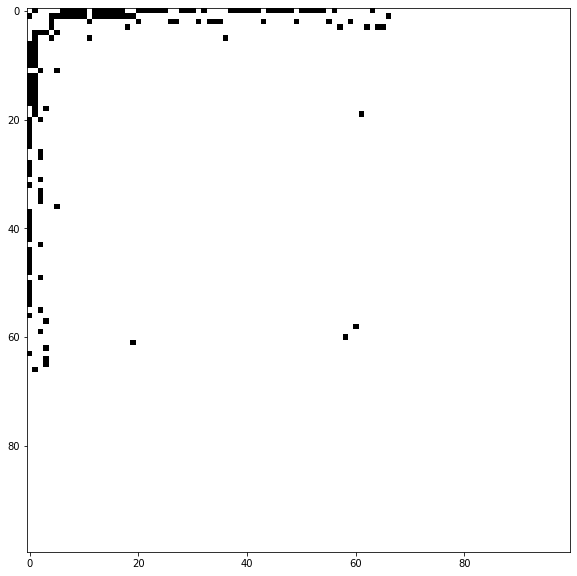

In [264]:
G=nx.from_numpy_array(np.array(simutable[15][36][8]))
degreeofday=dict(G.degree)
degreeofday_new={k: v for k, v in sorted(degreeofday.items(), key=lambda item: item[1], reverse=True)}
nodenewlist=list(degreeofday_new.keys())
draw_adjacency_matrix(G,nodenewlist)

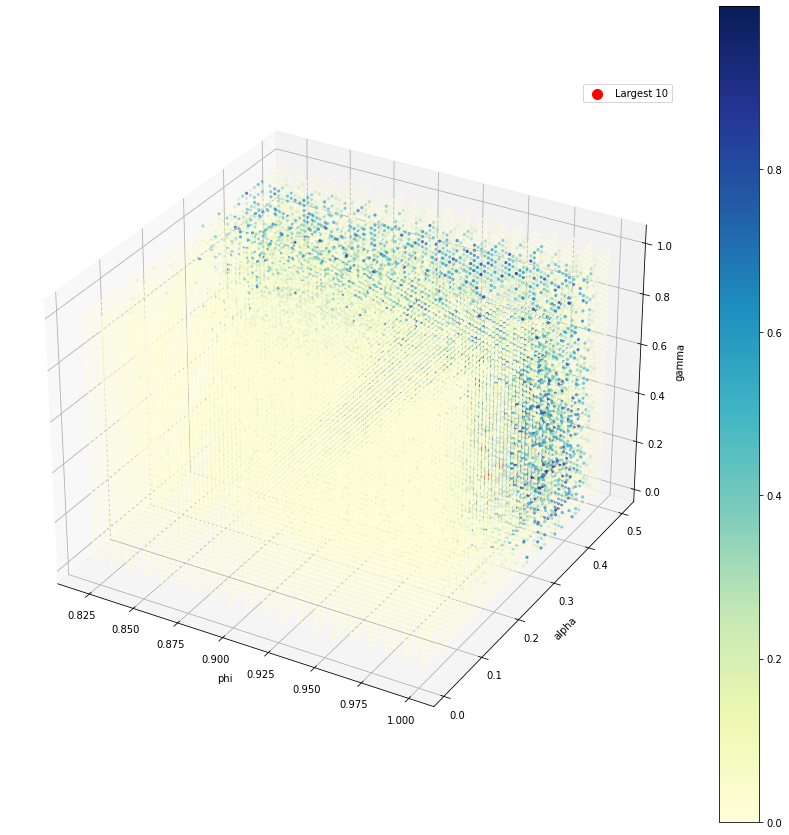

In [267]:
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Sample data
x = np.linspace(0.82, 1, 20)
y = np.linspace(0.01, 0.5, 50)
z = np.linspace(0.02, 1, 50)

# Create a 3D grid of coordinates using np.meshgrid
X, Y, Z = np.meshgrid(x, y, z, indexing='ij')

# Create 3D scatter plot
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(111, projection='3d')

# Flatten the coordinate arrays and likelihood list
x_flat, y_flat, z_flat = X.flatten(), Y.flatten(), Z.flatten()
likelihood_flat = np.array(likelihoodlist).flatten()

# Scatter plot with colors from likelihoodlist
p = ax.scatter(x_flat, y_flat, z_flat, c=likelihood_flat, cmap='YlGnBu', marker='.')

# Set labels for each axis
ax.set_xlabel('phi')
ax.set_ylabel('alpha')
ax.set_zlabel('gamma')

# Add colorbar
fig.colorbar(p, ax=ax, cmap='YlGnBu')

# Find indices of the largest 10 points
indices_largest = np.argpartition(likelihood_flat, -10)[-10:]

# Mark the largest points with red color
ax.scatter(x_flat[indices_largest], y_flat[indices_largest], z_flat[indices_largest],
           c='red', s=100, marker='o', label='Largest 10')

# Show the legend
ax.legend()

plt.show()

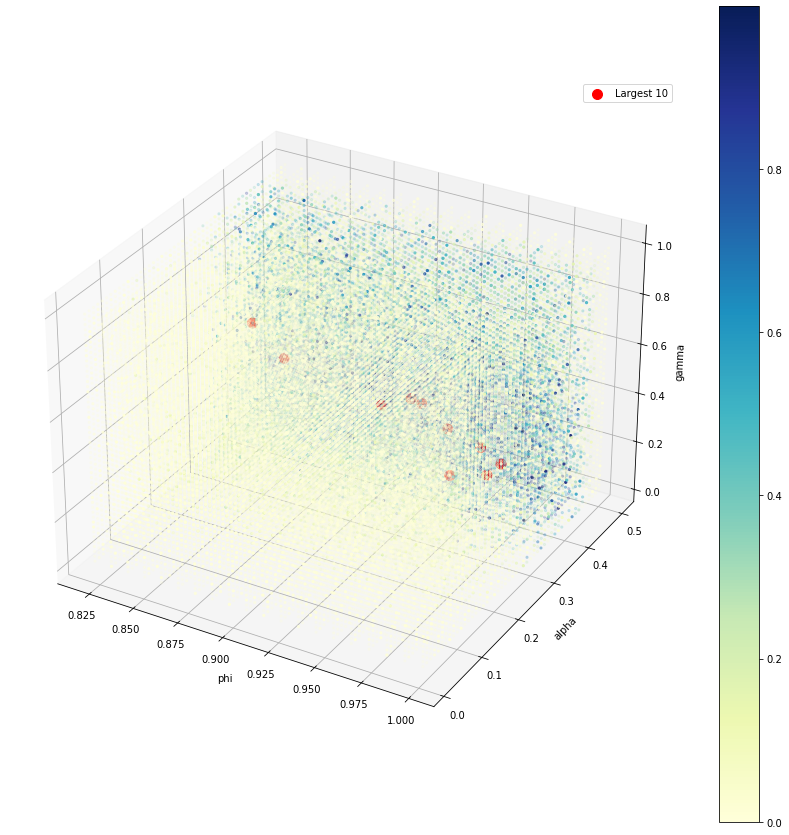

In [266]:
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Sample data
x = np.linspace(0.82, 1, 20)
y = np.linspace(0.01, 0.5, 50)
z = np.linspace(0.02, 1, 50)

# Create a 3D grid of coordinates using np.meshgrid
X, Y, Z = np.meshgrid(x, y, z, indexing='ij')

# Replace this line with your actual likelihoodlist
likelihoodlist = np.array(likelihoodlist)

# Create 3D scatter plot
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(111, projection='3d')

# Flatten the coordinate arrays and likelihood list
x_flat, y_flat, z_flat = X.flatten(), Y.flatten(), Z.flatten()
likelihood_flat = likelihoodlist.flatten()

# Calculate alpha (transparency) based on likelihood values
alpha_values = 0.2 + 0.8 * (likelihood_flat - np.min(likelihood_flat)) / (np.max(likelihood_flat) - np.min(likelihood_flat))

# Scatter plot with colors and transparency
p = ax.scatter(x_flat, y_flat, z_flat, c=likelihood_flat, cmap='YlGnBu', marker='.', alpha=alpha_values)

# Set labels for each axis
ax.set_xlabel('phi')
ax.set_ylabel('alpha')
ax.set_zlabel('gamma')

# Add colorbar
fig.colorbar(p, ax=ax, cmap='YlGnBu')

# Find indices of the largest 10 points
indices_largest = np.argpartition(likelihood_flat, -10)[-10:]

# Mark the largest points with red color and higher opacity
ax.scatter(x_flat[indices_largest], y_flat[indices_largest], z_flat[indices_largest],
           c='red', s=100, marker='o', label='Largest 10', alpha=1.0)

# Show the legend
ax.legend()

plt.show()

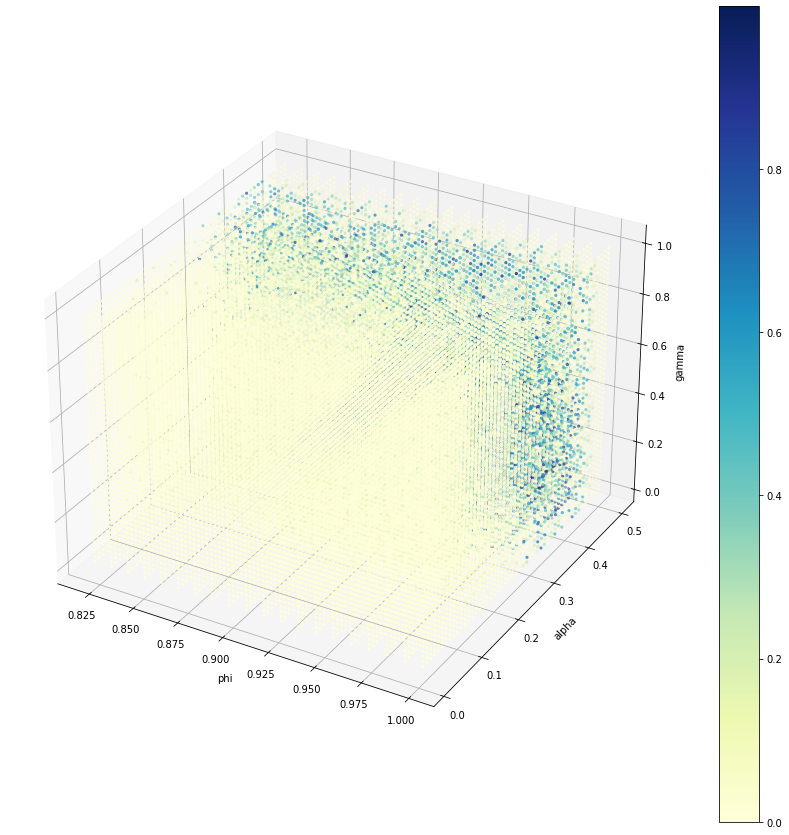

In [268]:
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Sample data
x = np.linspace(0.82, 1, 20)
y = np.linspace(0.01, 0.5, 50)
z = np.linspace(0.02, 1, 50)

# Create a 3D grid of coordinates using np.meshgrid
X, Y, Z = np.meshgrid(x, y, z, indexing='ij')


# Create 3D scatter plot
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(111, projection='3d')

# Flatten the coordinate arrays and likelihood list
x_flat, y_flat, z_flat = X.flatten(), Y.flatten(), Z.flatten()
likelihood_flat = np.array(likelihoodlist).flatten()

# Scatter plot with colors from likelihoodlist
p = ax.scatter(x_flat, y_flat, z_flat, c=likelihood_flat,cmap='YlGnBu', marker='.')

# Set labels for each axis
ax.set_xlabel('phi')
ax.set_ylabel('alpha')
ax.set_zlabel('gamma')

# Add colorbar
fig.colorbar(p, ax=ax, cmap='YlGnBu')


In [ ]:
# statistical plotting

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Generate or load your two networks (G1 and G2)
# For simplicity, let's create two random graphs for illustration purposes
G1 = G_empirical # Replace this with your actual data for the first network
G2 = G # Replace this with your actual data for the second network

# Calculate degree distributions
degree_dist_G1 = [degree for node, degree in G1.degree()]
degree_dist_G2 = [degree for node, degree in G2.degree()]

# Plot degree distributions
plt.hist(degree_dist_G1, bins=20, alpha=0.5, label='Network 1')
plt.hist(degree_dist_G2, bins=20, alpha=0.5, label='Network 2')

plt.title('Degree Distribution of Two Networks')
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.legend()
plt.show()

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from collections import Counter

# Generate or load your two networks (G1 and G2)
# For simplicity, let's create two random graphs for illustration purposes
G1 =  G_empirical  # Replace this with your actual data for the first network
G2 = G   # Replace this with your actual data for the second network

# Calculate degree distributions
degree_dist_G1 = dict(Counter(dict(G1.degree()).values()))
degree_dist_G2 = dict(Counter(dict(G2.degree()).values()))

# Create scatter plot
plt.scatter(degree_dist_G1.keys(), degree_dist_G1.values(), alpha=0.5, label='Network 1')
plt.scatter(degree_dist_G2.keys(), degree_dist_G2.values(), alpha=0.5, label='Network 2')


plt.xscale('log')
plt.yscale('log')

plt.title('Scatter Plot of Degree Frequencies')
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.legend()
plt.show()

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Generate or load your two networks (G1 and G2)
# For simplicity, let's create two random graphs for illustration purposes
G1 = G_empirical  # Replace this with your actual data for the first network
G2 = G # Replace this with your actual data for the second network

# Calculate average nearest neighbor degrees
avg_nn_degree_G1 = list(nx.average_neighbor_degree(G1).values())
avg_nn_degree_G2 = list(nx.average_neighbor_degree(G2).values())

# Plot histograms
plt.hist(avg_nn_degree_G1, bins=20, alpha=0.5, label='Network 1')
plt.hist(avg_nn_degree_G2, bins=20, alpha=0.5, label='Network 2')

plt.title('Average Nearest Neighbor Degree Distribution of Two Networks')
plt.xlabel('Average Nearest Neighbor Degree')
plt.ylabel('Frequency')
plt.legend()
plt.show()

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Generate or load your two networks (G1 and G2)
# For simplicity, let's create two random graphs for illustration purposes
G1 = G_empirical  # Replace this with your actual data for the first network
G2 = G  # Replace this with your actual data for the second network

# Calculate degrees and average nearest neighbor degrees
degrees_G1 = dict(G1.degree())
avg_nn_degree_G1 = nx.average_neighbor_degree(G1)

degrees_G2 = dict(G2.degree())
avg_nn_degree_G2 = nx.average_neighbor_degree(G2)

# Extract values for scatter plot
x_values_G1 = list(degrees_G1.values())
y_values_G1 = list(avg_nn_degree_G1.values())

x_values_G2 = list(degrees_G2.values())
y_values_G2 = list(avg_nn_degree_G2.values())

# Create scatter plot
plt.scatter(x_values_G1, y_values_G1, alpha=0.5, label='Network 1')
plt.scatter(x_values_G2, y_values_G2, alpha=0.5, label='Network 2')

plt.xscale('log')
plt.yscale('log')

plt.title('Scatter Plot of Degree vs. Average Nearest Neighbor Degrees')
plt.xlabel('Degree')
plt.ylabel('Average Nearest Neighbor Degree')
plt.legend()
plt.show()



In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Generate or load your two networks (G1 and G2)
# For simplicity, let's create two random graphs for illustration purposes
G1 = G_empirical  # Replace this with your actual data for the first network
G2 = G # Replace this with your actual data for the second network

# Calculate clustering coefficients
clustering_G1 = list(nx.clustering(G1).values())
clustering_G2 = list(nx.clustering(G2).values())

# Plot histograms
plt.hist(clustering_G1, bins=20, alpha=0.5, label='Network 1')
plt.hist(clustering_G2, bins=20, alpha=0.5, label='Network 2')

plt.title('Clustering Coefficient Distribution of Two Networks')
plt.xlabel('Clustering Coefficient')
plt.ylabel('Frequency')
plt.legend()
plt.show()


In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Generate or load your two networks (G1 and G2)
# For simplicity, let's create two random graphs for illustration purposes
G1 = G_empirical # Replace this with your actual data for the first network
G2 = G  # Replace this with your actual data for the second network

# Calculate clustering coefficients and node degrees
clustering_G1 = nx.clustering(G1)
clustering_G2 = nx.clustering(G2)

degrees_G1 = dict(G1.degree())
degrees_G2 = dict(G2.degree())

# Extract values for plotting
nodes_G1, coefficients_G1 = zip(*clustering_G1.items())
nodes_G2, coefficients_G2 = zip(*clustering_G2.items())

degrees_values_G1 = [degrees_G1[node] for node in nodes_G1]
degrees_values_G2 = [degrees_G2[node] for node in nodes_G2]

# Plot scatter plot with x-axis as node degree
plt.scatter(degrees_values_G1, coefficients_G1, label='Network 1', alpha=0.7)
plt.scatter(degrees_values_G2, coefficients_G2, label='Network 2', alpha=0.7)

plt.xscale('log')
plt.yscale('log')


plt.title('Clustering Coefficient vs Node Degree Scatter Plot of Two Networks')
plt.xlabel('Node Degree')
plt.ylabel('Clustering Coefficient')
plt.legend()
plt.show()

